In [1]:
import pickle
import matplotlib
import matplotlib.pyplot as plt; plt.style.use('ggplot')
import seaborn as sns; sns.set_context('notebook')
from datetime import datetime
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
# torch.autograd.set_detect_anomaly(True)

In [2]:
batterySet = pickle.load(open("./Battery_Data/new_battery_cycles/new_battery_v2.p", 'rb'))

In [3]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

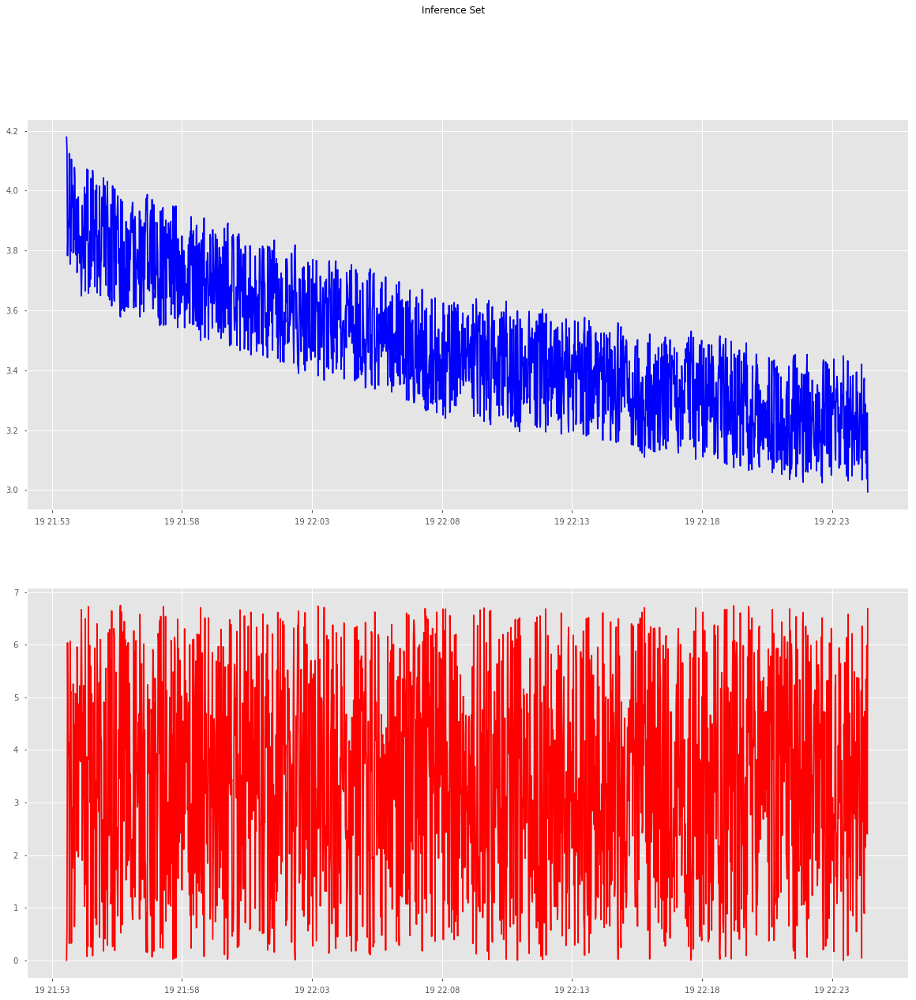

In [4]:
charSet = batterySet[5]
matplotlib.rcParams['figure.figsize'] = (20.0, 20.0)
plt.figure(0)
plt.suptitle('Inference Set')
plt.subplot(211)
plt.plot(charSet['datetime'].T, charSet['Voltage'].T, 'b')
plt.subplot(212)
plt.plot(charSet['datetime'].T, -charSet['Current'].T, 'r')

In [5]:
class Observation(nn.Module):
    def __init__(self, layers = [1024, 512], p=0.25):
        super(Observation, self).__init__()
        self.fc1 = nn.Linear(2, layers[0])
        self.depth = len(layers)
        self.p = p
        if len(layers) >= 2:
            self.fc2 = nn.Linear(layers[0], layers[1])
        if len(layers) == 3:
            self.fc3 = nn.Linear(layers[1], layers[2])
        self.out = nn.Linear(layers[-1], 1)
                
    def forward(self, x):
        x = torch.sigmoid(self.fc1(x))
        x = F.dropout(x, training=self.training, p=self.p)
        if self.depth >= 2:
            x = torch.sigmoid(self.fc2(x))
            x = F.dropout(x, training=self.training, p=self.p)
        if self.depth == 3:
            x = torch.sigmoid(self.fc3(x))
            x = F.dropout(x, training=self.training, p=self.p)
        x = self.out(x)
        return x  

In [6]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
observation = Observation()
observation.load_state_dict(torch.load("./Battery_Data/new_battery_cycles/Observation_v2.mdl"))
observation.eval()
observation.to(device)

Observation(
  (fc1): Linear(in_features=2, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=512, bias=True)
  (out): Linear(in_features=512, out_features=1, bias=True)
)

In [7]:
class StateTransition(nn.Module):
    def __init__(self, layers = [1024, 512], p=0.25):
        super(StateTransition, self).__init__()
        self.fc1 = nn.Linear(2, layers[0])
        self.depth = len(layers)
        self.p = p
        if len(layers) >= 2:
            self.fc2 = nn.Linear(layers[0], layers[1])
        if len(layers) == 3:
            self.fc3 = nn.Linear(layers[1], layers[2])
        self.out = nn.Linear(layers[-1], 1)
                
    def forward(self, x):
        x = torch.sigmoid(self.fc1(x))
        x = F.dropout(x, training=self.training, p=self.p)
        if self.depth >= 2:
            x = torch.sigmoid(self.fc2(x))
            x = F.dropout(x, training=self.training, p=self.p)
        if self.depth == 3:
            x = torch.sigmoid(self.fc3(x))
            x = F.dropout(x, training=self.training, p=self.p)
        x = self.out(x)
        return x  

In [8]:
state_transition = StateTransition()
# init
for W in state_transition.parameters():
    nn.init.normal_(W)
state_transition.eval()
state_transition.to(device)

StateTransition(
  (fc1): Linear(in_features=2, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=512, bias=True)
  (out): Linear(in_features=512, out_features=1, bias=True)
)

In [9]:
from torch.autograd import Variable
mu = Variable(torch.ones(1, requires_grad=True)*0.0)
sigma = Variable(torch.ones(1, requires_grad=True)*0.01) 
                
def transition_kernel(x):
    result = torch.normal(x + mu, torch.ones_like(x)*sigma)
    return result

In [10]:
# Optimisers
expectation = optim.Adam([mu, sigma])
maximisation = optim.Adam(state_transition.parameters())

In [11]:
Characterisation_Set = pickle.load(open("Battery_Data/new_battery_cycles/Characterisation_Set.p", 'rb'))

In [12]:
SoC_max, SoC_min = Characterisation_Set['preprocessing']['SoC']
print(SoC_max, SoC_min)
Current_max, Current_min = Characterisation_Set['preprocessing']['Current']
print(Current_max, Current_min)

0.9999999904515033 1.7066589027420198e-14
6.74372 -0.000520787


In [13]:
from ParticleFilter.Tools import resample

def train(N, start, stop, state, g_std=0.02):
    first = True
    scaled_state = torch.empty_like(state)
    nu = torch.Tensor([1.0 / (0.2 * np.sqrt(2 * np.pi))])
    
    for t in range(start, stop):

        V_measured = torch.Tensor([charSet['Voltage'][0, t]])

        state[:, 1:2] = (charSet['Current'][0, t] - Current_min)/(Current_max - Current_min)

        # State Transition
        transition = state_transition(state.to(device)).to("cpu")
        kernel_result = transition_kernel(transition)
        state[:, 0:1] = kernel_result[:, 0:1]
        
        # Bounds
        max_test = state[:, 0] > 1.0
        state[max_test, 0] = 1.0
        min_test = state[:, 0] < 0.0
        state[min_test, 0] = 0.0000000001

        # Observation
        scaled_SoC = (state - SoC_min)/(SoC_max - SoC_min)
        scaled_state[:, 0:1] = scaled_SoC[:, 0:1]
        scaled_current = (charSet['Current'][0, t] - Current_min)/(Current_max - Current_min)
        scaled_state[:, 1] = scaled_current
        V = observation(scaled_state.to(device)).to("cpu")
        V_est = V.clone()
        
        # Likelihood
        logW = torch.log(nu) - 0.5*torch.pow((V_est - V_measured)/g_std, 2.0)
        max_logW = logW.max()
        loss_W = torch.exp(logW - max_logW)

        if not first:
            loss = loss + max_logW + torch.log(torch.sum(loss_W)) - torch.Tensor([np.log(N)])
        else:
            loss = max_logW + torch.log(torch.sum(loss_W)) - torch.Tensor([np.log(N)])
            first = False

        resampled, W = resample(state, loss_W)
        state[:, 0:1] = resampled[:, 0:1]

    loss = -1*loss  # We are **maximising** the ELBO => minimising KL divergence
    loss.backward()
    return state, loss
    

In [14]:
def linspace_iter(data, num):
    iterable = np.linspace(0, data.shape[1], num + 1, dtype=np.int)
    for i in range((len(iterable) - 1)):
        yield iterable[i], iterable[i + 1]

In [15]:
from datetime import datetime
filename = datetime.now().isoformat()

In [16]:
-

epoch 0
None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.382

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.30

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

time_remaining: 1.0998040440703643 min
epoch 119
None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.30

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962,
         0.5134, -0.2281, -0.0961,  0.3894,  0.9396, -1.1859,  0.0849, -0.0061,
        -0.3140,  0.3150, -0.7467,  0.1873,  0.3699, -2.0769, -0.6987, -0.9232,
        -0.3375, -0.2257,  0.6312,  1.2395,  1.6699,  1.0313, -0.4069,  0.5393,
        -0.6874, -1.2780,  0.7051, -0.3762, -1.1204,  0.6786,  2.0328, -1.0737,
         0.9820,  0.4773,  1.5691,  2.4219,  1.3403, -0.1858, -0.4663,  2.4127,
        -1.3242, -0.9601,  1.2412,  0.5142,  1.3440, -1.5905,  2.4721, -1.0232,
        -1.0777,  

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962,
         0.5134, -0.2281, -0.0961,  0.3894,  0.9396, -1.1859,  0.0849, -0.0061,
        -0.3140,  0.3150, -0.7467,  0.1873,  0.3699, -2.0769, -0.6987, -0.9232,
        -0.3375, -0.2257,  0.6312,  1.2395,  1.6699,  1.0313, -0.4069,  0.5393,
        -0.6874, -1.2780,  0.7051, -0.3762, -1.1204,  0.6786,  2.0328, -1.0737,
         0.9820,  0.4773,  1.5691,  2.4219,  1.3403, -0.1858, -0.4663,  2.4127,
        -1.3242, -0.9601,  1.2412,  0.5142,  1.3440, -1.5905,  2.4721, -1.0232,
        -1.0777,  

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.30

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.30

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.30

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962,
         0.5134, -0.2281, -0.0961,  0.3894,  0.9396, -1.1859,  0.0849, -0.0061,
        -0.3140,  0.3150, -0.7467,  0.1873,  0.3699, -2.0769, -0.6987, -0.9232,
        -0.3375, -0.2257,  0.6312,  1.2395,  1.6699,  1.0313, -0.4069,  0.5393,
        -0.6874, -1.2780,  0.7051, -0.3762, -1.1204,  0.6786,  2.0328, -1.0737,
         0.9820,  0.4773,  1.5691,  2.4219,  1.3403, -0.1858, -0.4663,  2.4127,
        -1.3242, -0.9601,  1.2412,  0.5142,  1.3440, -1.5905,  2.4721, -1.0232,
        -1.0777,  

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962,
         0.5134, -0.2281, -0.0961,  0.3894,  0.9396, -1.1859,  0.0849, -0.0061,
        -0.3140,  0.3150, -0.7467,  0.1873,  0.3699, -2.0769, -0.6987, -0.9232,
        -0.3375, -0.2257,  0.6312,  1.2395,  1.6699,  1.0313, -0.4069,  0.5393,
        -0.6874, -1.2780,  0.7051, -0.3762, -1.1204,  0.6786,  2.0328, -1.0737,
         0.9820,  0.4773,  1.5691,  2.4219,  1.3403, -0.1858, -0.4663,  2.4127,
        -1.3242, -0.9601,  1.2412,  0.5142,  1.3440, -1.5905,  2.4721, -1.0232,
        -1.0777,  

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.382

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.30

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962,
         0.5134, -0.2281, -0.0961,  0.3894,  0.9396, -1.1859,  0.0849, -0.0061,
        -0.3140,  0.3150, -0.7467,  0.1873,  0.3699, -2.0769, -0.6987, -0.9232,
        -0.3375, -0.2257,  0.6312,  1.2395,  1.6699,  1.0313, -0.4069,  0.5393,
        -0.6874, -1.2780,  0.7051, -0.3762, -1.1204,  0.6786,  2.0328, -1.0737,
         0.9820,  0.4773,  1.5691,  2.4219,  1.3403, -0.1858, -0.4663,  2.4127,
        -1.3242, -0.9601,  1.2412,  0.5142,  1.3440, -1.5905,  2.4721, -1.0232,
        -1.0777,  

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[ 0.4120, -0.2105, -0.3098, -1.0889, -0.1341,  0.0015, -0.7583,  1.9136,
         -0.9546,  0.0849, -1.8224, -0.1443,  1.0023, -0.8758,  0.4141,  1.8787,
          0.7625, -0.0561,  0.7342, -0.5409, -1.0896,  0.4373,  0.3552, -0.5858,
          0.1038, -0.4161,  0.1281,  0.2930, -0.9374, -0.4133, -0.3314, -1.6128,
         -0.4087, -0.9425, -1.0525,  0.3459, -0.5972, -0.3618, -0.4956,  1.4603,
          0.4334, -0.7434,  0.8043, -0.3505, -0.5970,  1.0262, -0.1552,  1.6940,
          1.0502,  1.0954, -0.3684, -0.0876,  0.9282, -0.1713,  2.4791, -0.6665,
          1.4999, -1.1878,  0.2253,  0.1432,  0.0500, -1.2949, -0.8186, -0.4721,
         -0.4401, -1.0411,  1.1363, -1.0309,  0.8162,  1.2303, -0.5242,  1.3886,
          0.3324, -1.5810,  0.5840,  0.0756, -0.2499, -0.3495,  0.0352,  1.1533,
         -1.4478, -1.0392,  0.6108,  0.8630,  1.1957,  0.6320, -0.9991, -3.1627,
         -0.4618, -0.6299, -0.2199, -0.7074, -0.6989,  0.8724,  0.3243,  1.6684,
      

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962,
         0.5134, -0.2281, -0.0961,  0.3894,  0.9396, -1.1859,  0.0849, -0.0061,
        -0.3140,  0.3150, -0.7467,  0.1873,  0.3699, -2.0769, -0.6987, -0.9232,
        -0.3375, -0.2257,  0.6312,  1.2395,  1.6699,  1.0313, -0.4069,  0.5393,
        -0.6874, -1.2780,  0.7051, -0.3762, -1.1204,  0.6786,  2.0328, -1.0737,
         0.9820,  0.4773,  1.5691,  2.4219,  1.3403, -0.1858, -0.4663,  2.4127,
        -1.3242, -0.9601,  1.2412,  0.5142,  1.3440, -1.5905,  2.4721, -1.0232,
        -1.0777,  

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([-0.7918], device='cuda:0', requires_grad=True)
Epoch: 871 Expectation loss: 157963.609375 Maximisation loss: 157963.609375
exec time: 0.0005198836326599122 min
time_remaining: 0.6537244492714556 min
epoch 872
None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.3822,  1.3426,  0.1697,  0.3101,  1.3490, -0.0903, -0.2815,
        -0.2385,  2.3522,  0.8458,  0.4561,  0.9951, -0.1192,  0.7639, -0.3962

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([-0.7918], device='cuda:0', requires_grad=True)
Epoch: 979 Expectation loss: 157963.609375 Maximisation loss: 157963.609375
exec time: 0.0005471030871073405 min
time_remaining: 0.5879241522477598 min
epoch 980
None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.7965,  1.5200,  0.7857,  0.2231,  0.0583,  0.0790,  0.6644,
        -0.9956,  1.3580, -1.2823,  0.3883, -0.1024,  1.0178,  2.0624,  0.8327,
        -0.1466, -0.4273,  1.0683,  0.7056,  0.8660, -1.1785,  0.9158, -0.3378,
        -2.0801,  0.382

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

time_remaining: 0.5758902668952943 min
epoch 1000
None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698,  1.3008, -1.3299, -0.0278, -0.7174,  1.8411, -0.4707,
        -0.0307, -1.79

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}
Parameter containing:
tensor([[-0.8879,  0.8063],
        [ 0.5554,  1.6607],
        [ 0.7712,  0.1790],
        ...,
        [ 1.2629, -0.6915],
        [-0.8319, -0.4955],
        [-1.5392,  2.8139]], device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.3762,  0.7954, -2.2860,  ..., -1.6659, -0.5197, -0.8012],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([[-0.3297, -0.3200, -1.6386,  ..., -0.9892,  0.4818,  0.6559],
        [ 1.7218, -2.3548,  1.7676,  ...,  0.0760, -0.5037, -0.3342],
        [ 1.3424,  0.7911,  0.5218,  ...,  1.1161,  1.5790,  1.1123],
        ...,
        [-0.2780, -1.2907, -1.7622,  ..., -0.0209, -1.1065, -0.8119],
        [-0.6651, -0.6248,  1.5278,  ...,  1.7450, -0.8199, -0.4838],
        [ 0.0992, -0.2690, -0.5564,  ...,  0.3974, -0.9497,  0.6100]],
       device='cuda:0', requires_grad=True)
Parameter containing:
tensor([ 0.0711,  0.2698, 

None
Variational parameters {'mu': tensor([0.]), 'sigma': tensor([0.0100])}


KeyboardInterrupt: 